# Customer Personality Analysis

This notebook aims to perform data analysis and clustering to understand customer behaviour and design commercial strategies.
Data is pulled from the following [source](https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis).


## Data loading & library imports

The following code is optional. You can manually download the dataset from Kaggle and put it inside `./data` to continue.


In [1]:
# Dataset fetching using the kaggle API (optionally, you can manually download the csv) 
from dotenv import load_dotenv
%load_ext dotenv
%dotenv
load_dotenv()
!kaggle datasets download -p ./data -d imakash3011/customer-personality-analysis --unzip

  0%|                                               | 0.00/62.0k [00:00<?, ?B/s]
100%|███████████████████████████████████████| 62.0k/62.0k [00:00<00:00, 659kB/s]


In [2]:
# Import dependencies
import warnings
warnings.simplefilter("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager
import plotly.express as px
import seaborn as sns
from typing import Union, Optional
from dataprep.eda import plot
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

sns.set()
sns.set_palette("Set2")

In [3]:
# Load data and list basic properties of the dataset
raw_data = pd.read_csv("./data/marketing_campaign.csv", sep="\t")
print("Data Info: ")
raw_data.info()

Data Info: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 

## Cleaning and Preprocessing

In order to understand and find insights of the data, I'll use the dataprep module to analyze each variable.


  0%|          | 0/122 [00:00<?, ?it/s]


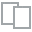
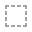
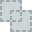
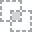
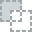
...
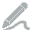
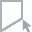
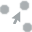
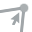
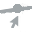

In [4]:
# Pre-EDA per field (Choose variable to see an overview of it)
plot(raw_data, "Income")

Using the findings in the analysis above, we will change the dataset as follows.

- Rename variables for clarity.
- Drop outliers on the following variables: YearBirth, Income, MntMeatProducts.
- Add some relevant calculated fields: age, enrollment_days, total_spending, total_purchases, average_purchase_value, family_size, has_accepted_cm (1 if the customer accepted at least one campaign), has_kids (1 if the customer has at least one kid).
- Encode the following categorical fields: Education (1 if he graduated or has a Master/Ph.D.), Marital Status (1 if he is with someone).
- Drop redundant and irrelevant fields.


In [5]:
# Data Preprocessing
def pre_process(
    raw_data: pd.DataFrame,
) -> pd.DataFrame:
    # Copy raw_data
    data = raw_data.copy()

    # Column renaming for clarity
    data.rename(
        columns={
            "ID": "id",
            "Year_Birth": "year_birth",
            "Education": "education",
            "Marital_Status": "marital_status",
            "Income": "income",
            "Kidhome": "n_kid_home",
            "Teenhome": "n_teen_home",
            "Dt_Customer": "dt_customer",
            "Recency": "recency",
            "MntWines": "wine",
            "MntFruits": "fruit",
            "MntMeatProducts": "meat",
            "MntFishProducts": "fish",
            "MntSweetProducts": "sweet",
            "MntGoldProds": "gold",
            "NumDealsPurchases": "n_deal_purchases",
            "NumWebPurchases": "n_web_purchases",
            "NumCatalogPurchases": "n_catalog_purchases",
            "NumStorePurchases": "n_store_purchases",
            "NumWebVisitsMonth": "n_web_visits",
            "AcceptedCmp1": "cmp1",
            "AcceptedCmp2": "cmp2",
            "AcceptedCmp3": "cmp3",
            "AcceptedCmp4": "cmp4",
            "AcceptedCmp5": "cmp5",
            "Complain": "complain",
            "Response": "response",
            "Z_CostContact": "z_cost_contact",
            "Z_Revenue": "z_revenue",
        },
        inplace=True,
    )

    # Drop YearBirth and Income Outliers.
    data["year_birth"] = data["year_birth"].mask(
        data["year_birth"] < 1_940, data.year_birth.median()
    )
    data["income"] = data["income"].mask(data["income"] > 500_000, data.income.median())

    # Add Age - Dataset date is 2014
    data["age"] = 2014 - data.year_birth

    # Add Enrollment days
    data["dt_customer"] = pd.to_datetime(data["dt_customer"], format="%d-%m-%Y")
    most_recent = data.dt_customer.max()
    data["enrollment_days"] = (most_recent - data.dt_customer).dt.days

    # Add total spending field
    data["total_spending"] = data[
        [
            "wine",
            "fruit",
            "meat",
            "fish",
            "sweet",
            "gold",
        ]
    ].sum(axis=1)

    # Add total purchases field
    data["total_purchases"] = data[
        ["n_web_purchases", "n_catalog_purchases", "n_store_purchases"]
    ].sum(axis=1)

    # Add Childrem/Teens flag
    data["has_kids"] = np.where(data.n_kid_home + data.n_teen_home > 0, 1, 0)

    # Add Average Purchase Value
    data["average_purchase_value"] = data["total_spending"] / data["total_purchases"]
    data.average_purchase_value.replace([np.inf], 0, inplace=True)
    data.fillna(0, inplace=True)

    ## Remove Outlier
    data["average_purchase_value"] = data.average_purchase_value.mask(
        data.average_purchase_value > 400, data.average_purchase_value.median()
    )

    # Categorical Values Encoding
    data["education"].replace(
        {"Basic": 0, "2n Cycle": 0, "Graduation": 1, "Master": 1, "PhD": 1},
        inplace=True,
    )

    data["marital_status"].replace(
        {
            "Married": 1,
            "Together": 1,
            "Single": 0,
            "Divorced": 0,
            "Widow": 0,
            "Alone": 0,
            "Absurd": 0,
            "YOLO": 0,
        },
        inplace=True,
    )

    # Add Family Size
    data["family_size"] = (
        data[["n_kid_home", "n_teen_home", "marital_status"]].sum(axis=1) + 1
    )

    # Add accepted any campaing flag
    data["has_accepted_cmp"] = data[["cmp1", "cmp2", "cmp3", "cmp4", "cmp5"]].sum(
        axis=1
    )
    data["has_accepted_cmp"] = data.has_accepted_cmp.mask(data.has_accepted_cmp > 0, 1)

    # Drop redundant and useless columns
    drop_cols = ["id", "year_birth", "dt_customer", "z_cost_contact", "z_revenue"]
    data.drop(drop_cols, axis=1, inplace=True)

    return data


pre_processed_data = pre_process(raw_data)
print("Shape of data after preprocessing: ", pre_processed_data.shape)
print("Columns after preprocessing: ", pre_processed_data.columns)

Shape of data after preprocessing:  (2240, 32)
Columns after preprocessing:  Index(['education', 'marital_status', 'income', 'n_kid_home', 'n_teen_home',
       'recency', 'wine', 'fruit', 'meat', 'fish', 'sweet', 'gold',
       'n_deal_purchases', 'n_web_purchases', 'n_catalog_purchases',
       'n_store_purchases', 'n_web_visits', 'cmp3', 'cmp4', 'cmp5', 'cmp1',
       'cmp2', 'complain', 'response', 'age', 'enrollment_days',
       'total_spending', 'total_purchases', 'has_kids',
       'average_purchase_value', 'family_size', 'has_accepted_cmp'],
      dtype='object')


In [6]:
# Data Type lists
categorical_fields = [
    "education",
    "marital_status",
    "cmp3",
    "cmp4",
    "cmp5",
    "cmp1",
    "cmp2",
    "complain",
    "response",
    "has_kids",
    "has_accepted_cmp",
]
numerical_fields = [
    "income",
    "n_kid_home",
    "n_teen_home",
    "recency",
    "wine",
    "fruit",
    "meat",
    "fish",
    "sweet",
    "gold",
    "n_deal_purchases",
    "n_web_purchases",
    "n_catalog_purchases",
    "n_store_purchases",
    "n_web_visits",
    "age",
    "enrollment_days",
    "total_spending",
    "total_purchases",
    "average_purchase_value",
    "family_size",
]

## EDA

In this section, we will analyze the relationships between the preprocessed variables. First, we're going to take a look at the numerical fields of the dataset.


In [7]:
pd.DataFrame(pre_processed_data[numerical_fields].describe().T.round(2))

,count,mean,std,min,25%,50%,75%,max
income,2240.0,51412.78,22064.65,0.0,34722.00,51075.00,68275.75,162397.00
n_kid_home,2240.0,0.44,0.54,0.0,0.00,0.00,1.00,2.00
n_teen_home,2240.0,0.51,0.54,0.0,0.00,0.00,1.00,2.00
recency,2240.0,49.11,28.96,0.0,24.00,49.00,74.00,99.00
wine,2240.0,303.94,336.60,0.0,23.75,173.50,504.25,1493.00
fruit,2240.0,26.30,39.77,0.0,1.00,8.00,33.00,199.00
meat,2240.0,166.95,225.72,0.0,16.00,67.00,232.00,1725.00
fish,2240.0,37.53,54.63,0.0,3.00,12.00,50.00,259.00
sweet,2240.0,27.06,41.28,0.0,1.00,8.00,33.00,263.00
gold,2240.0,44.02,52.17,0.0,9.00,24.00,56.00,362.00


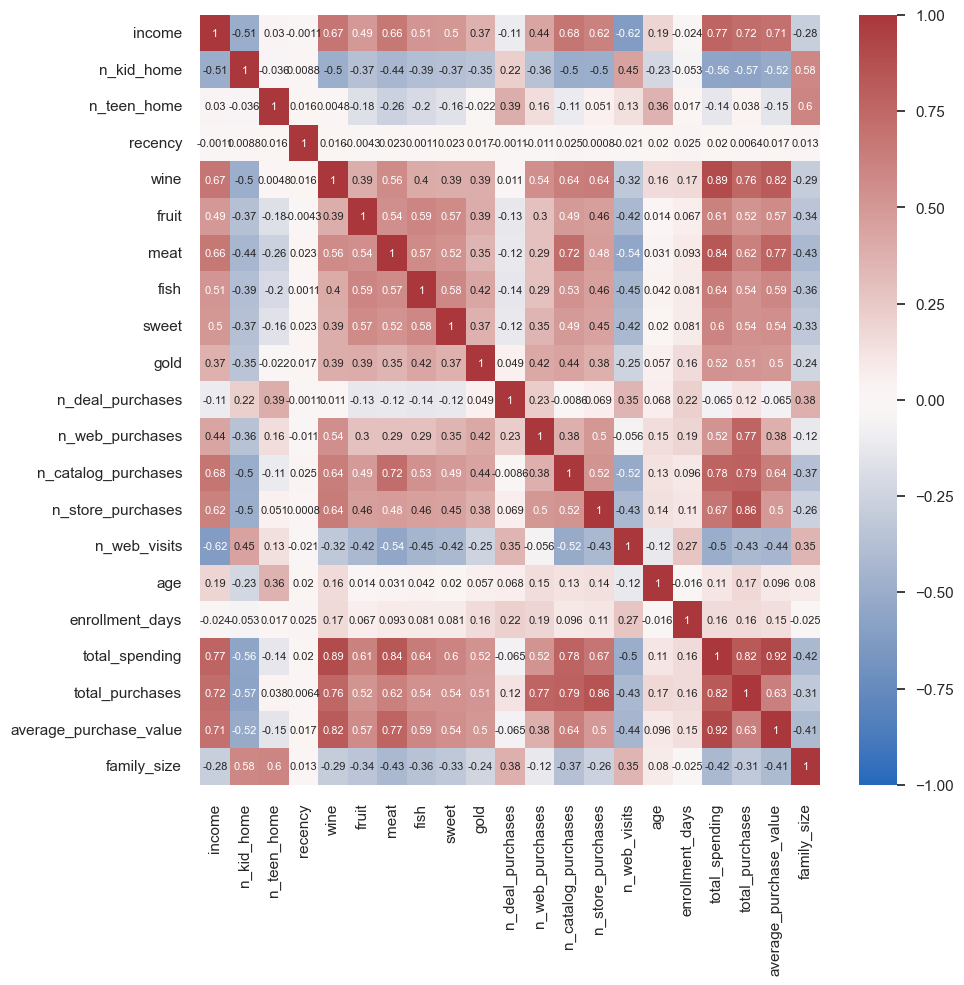

In [8]:
# Correlation Matrix
def corr_matrix(data: pd.DataFrame) -> None:
    corr_matrix = data.corr()
    plt.figure(figsize=(10, 10))
    sns.heatmap(
        corr_matrix,
        annot=True,
        center=0,
        annot_kws={"size": 8},
        cmap="vlag",
        vmin=-1,
        vmax=1,
    )
    plt.show()


corr_matrix(pre_processed_data[numerical_fields])

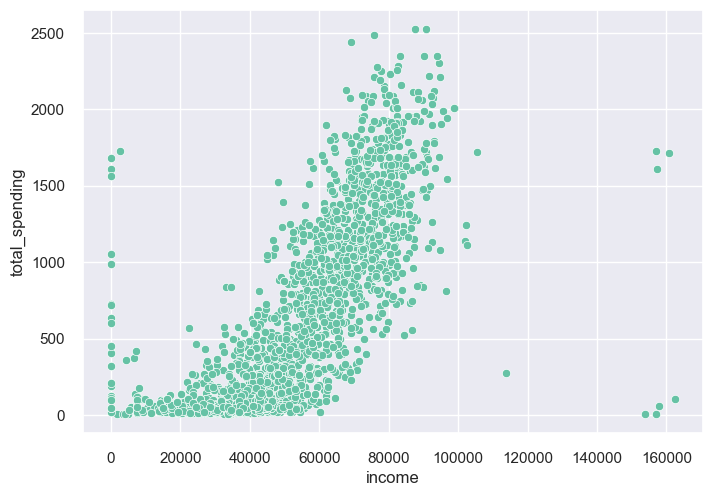

In [9]:
sns.scatterplot(
    data=pre_processed_data,
    x="income",
    y="total_spending",
    palette="Set2",
)
plt.show()

From the above charts, we can say the following:

- Customer Income and the amount spent on products are positively correlated.
- Wine and Meat are the most expensive products in the store.
- The number of kids in the household is negatively correlated with the amount spent.
- The number of teens in the household is correlated with the number of deal purchases.
- Recency and enrollment days are not correlated with any buying pattern.
- The number of website visits and the amount spent is negatively correlated.
- Some customers spend more than their income. This inconsistency could be an input error, or maybe the customer uses money from a partner or familiar.

Now let's look at the categorical variables and their relationship with the total amount spent per customer.


In [10]:
# % of true values per categorical values.
print(
    pd.DataFrame(
        pre_processed_data[categorical_fields].mean(axis=0), columns=["Avg."]
    ).to_string(formatters={"Avg.": "{:,.2%}".format})
)

                   Avg.
education        88.53%
marital_status   64.46%
cmp3              7.28%
cmp4              7.46%
cmp5              7.28%
cmp1              6.43%
cmp2              1.34%
complain          0.94%
response         14.91%
has_kids         71.52%
has_accepted_cmp 20.67%


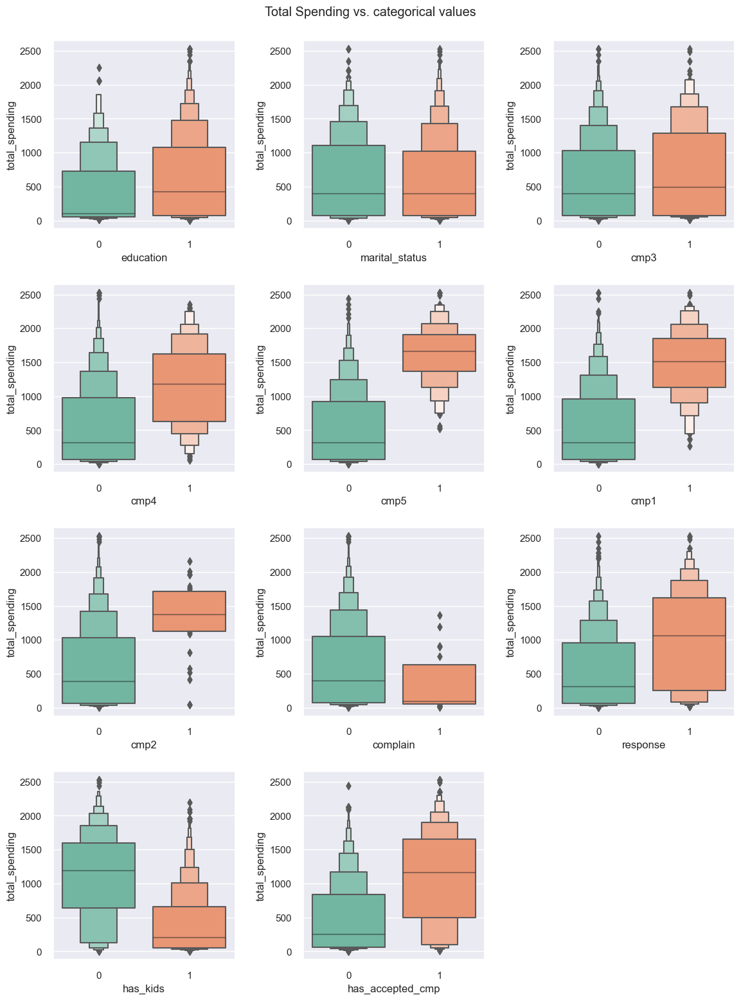

In [11]:
# Categorical fields values vs most important numerical field
def box_plots(data: pd.DataFrame, numeric_field: str, cat_fields: list[str]) -> None:
    fig_rows = 1 + (len(cat_fields) // 3)
    fig_cols = 3
    fig_sz = 4
    remain = fig_cols - (len(cat_fields) % fig_cols)
    fig, ax = plt.subplots(
        fig_rows, fig_cols, figsize=(fig_cols * fig_sz, fig_rows * fig_sz)
    )
    fig.suptitle("Total Spending vs. categorical values")

    for idx, cat_field in enumerate(cat_fields):
        sns.boxenplot(
            data=data,
            y=numeric_field,
            x=cat_field,
            ax=ax[idx // fig_cols, idx % fig_cols],
        )

    for i in reversed(range(remain)):
        fig.delaxes(ax[fig_rows - 1][fig_cols - 1 - i])

    plt.tight_layout(pad=2)


box_plots(
    pre_processed_data, numeric_field="total_spending", cat_fields=categorical_fields
)

From the above charts, we can say the following:

- Customer's marital status is not related to the amount spent in the stores.
- Campaigns and offers are effective. Campaigns 1, 2, and 5 were the most effective.
- Customer education level is related to the amount it can spend.
- Customer complaints reduce the amount they spend in the stores.

To perform clustering, we will remove highly correlated and seemingly irrelevant fields.


In [12]:
# Drop redundant fields
categorical_fields = [
    "education",
    "marital_status",
    "complain",
    "response",
    "has_kids",
    "has_accepted_cmp",
    "income",
    "n_kid_home",
    "n_teen_home",
    "recency",
    "wine",
    "fruit",
    "meat",
    "fish",
    "sweet",
    "gold",
    "n_deal_purchases",
    "n_web_purchases",
    "n_catalog_purchases",
    "n_store_purchases",
    "n_web_visits",
    "age",
    "enrollment_days",
    "total_spending",
    "total_purchases",
    "average_purchase_value",
    "family_size",
]

keep_fields = [
    "education",
    "marital_status",
    "income",
    "n_kid_home",
    "n_teen_home",
    "recency",
    "n_deal_purchases",
    "n_web_visits",
    "complain",
    "response",
    "age",
    "enrollment_days",
    "total_spending",
    "total_purchases",
    "has_kids",
    "average_purchase_value",
    "family_size",
    "has_accepted_cmp",
]

keep_cat_fields = [i for i in categorical_fields if i in keep_fields]
keep_num_fields = [i for i in numerical_fields if i in keep_fields]

processed_data = pre_processed_data[keep_fields].copy()

## Dimentionality Reduction


Before performing clustering, we will scale and use **Principal Component Analysis (PCA)** to reduce the size of the dataset and increase performance while modeling.


In [13]:
# Standard Scaling
def standard_scaler(data: pd.DataFrame) -> pd.DataFrame:
    scaler = StandardScaler()
    scaled_data = data.copy()
    scaled_data[keep_num_fields] = scaler.fit_transform(scaled_data[keep_num_fields])
    return scaled_data


scaled_data = standard_scaler(processed_data)

In [14]:
# Dimentionality Reduction using PCA
def dim_reduction(data: pd.DataFrame, n_components: Union[int, str]) -> pd.DataFrame:
    pca = PCA(n_components=n_components)
    pca.fit(data)
    pca_data = pd.DataFrame(pca.transform(data))
    return pca_data


def plot_3d(
    data: pd.DataFrame,
    x: str,
    y: str,
    z: str,
    color: Optional[str] = None,
    title: Optional[str] = None,
) -> None:
    fig = px.scatter_3d(
        data,
        x=x,
        y=y,
        z=z,
        color=color,
        size=pd.Series(np.full(data.shape[0], 8)),
        size_max=12,
        opacity=1,
        title=title,
    )
    fig.update_layout(autosize=False, margin=dict(l=0, r=0, b=0, t=40))
    fig.show()


pca_data = dim_reduction(scaled_data, "mle")
plot_data = dim_reduction(scaled_data, 3)

plot_3d(plot_data, x=0, y=1, z=2, title="3d Data Representation")

## Clustering and Evaluation

Now that we've reduced the number of variables, we will conduct clustering. To determine how many clusters are optimal, we are going to utilize the elbow method.


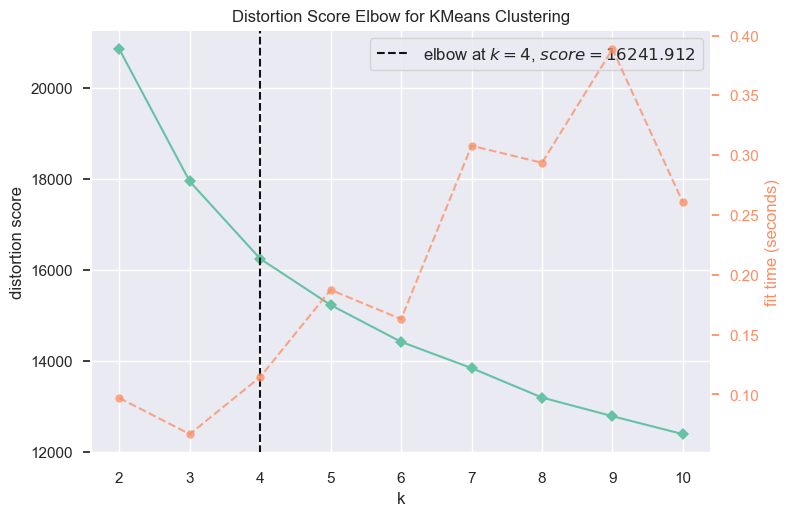

In [15]:
# Cluster Evaluation
def clust_eval(data: pd.DataFrame, k: int = 10) -> None:
    visualizer = KElbowVisualizer(KMeans(), k=k)
    visualizer.fit(data)
    visualizer.show()
    return visualizer.elbow_value_


elbow_value = clust_eval(scaled_data)

The chart above indicates that the optimal number of clusters for this problem is 4. Next, we will perform clustering using KMeans.


In [16]:
# Clustering
def clusterize(data: pd.DataFrame, cluster_instance) -> pd.DataFrame:
    clust = cluster_instance.fit(data)
    return clust.labels_


clusters = clusterize(scaled_data, KMeans(n_clusters=elbow_value, random_state=9))
clustered_data_plot = plot_data.copy()
clustered_data_plot["clusters"] = clusters
clustered_data = processed_data.copy()
clustered_data["clusters"] = clusters

plot_3d(
    clustered_data_plot,
    x=0,
    y=1,
    z=2,
    color="clusters",
    title="3d Representation of Clusters",
)

Since this is an unsupervised learning problem, there is no direct way to evaluate the model's score. To determine if the customer groups are useful, let's take a look at the data.
Here is the distribution of clients per cluster and how they relate to the total amount spent and their income.


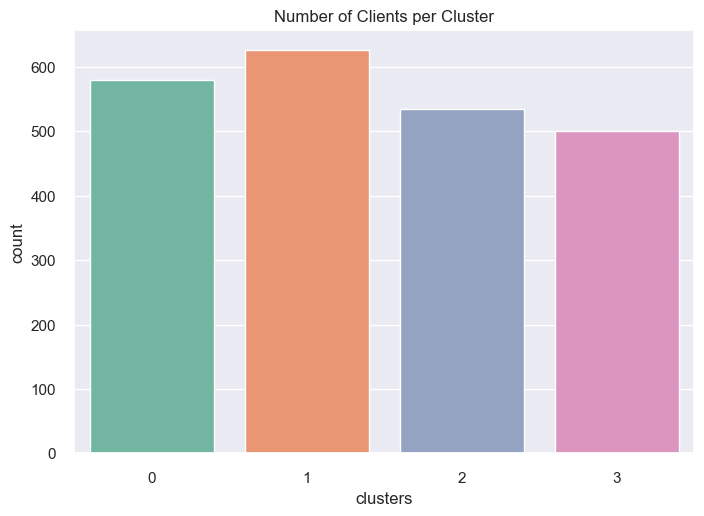

   clusters
1       626
0       580
2       534
3       500


In [17]:
# Cluster counts
sns.countplot(data=clustered_data, x="clusters").set(
    title="Number of Clients per Cluster"
)
plt.show()
print(pd.DataFrame(clustered_data.clusters.value_counts()))

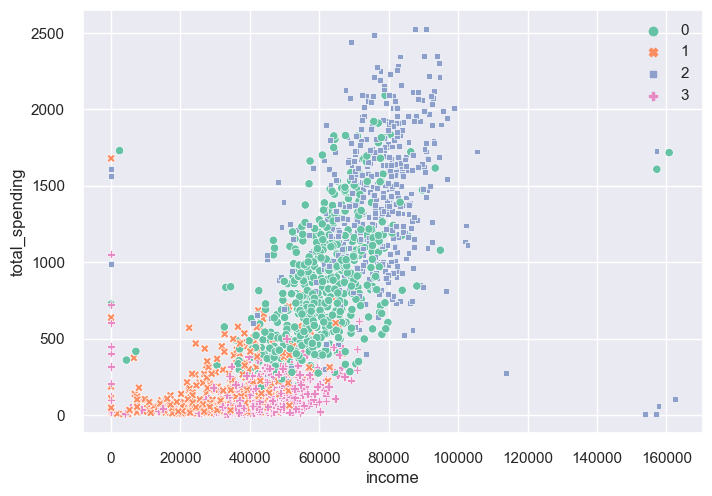

In [18]:
sns.scatterplot(
    data=clustered_data,
    x="income",
    y="total_spending",
    hue=clusters,
    style=clusters,
    palette="Set2",
)
plt.show()

## Customer Profiling


Using the below charts and tables we can arrive at the following conclusions about each cluster:

- Cluster 1:
  - Has low income and spending compared to the rest of the groups.
  - At most they have 3 family members at home.
  - Relatively younger than cluster 0 and 3.
  - They don't have teenagers at home.
- Cluster 3:
  - Higher income than cluster 1 but lower spending than cluster 2 and 0.
  - At least they have one tenager at home.
  - Relatively older than cluster 1.
  - At least 2 family members at home.
  - Many of them are single parents with 2 kids or more.
- Cluster 0:
  - Higher income and spending than cluster 1 and 3.
  - Slightly lower and spending than cluster 2.
  - At least they have one teenager at home.
  - Most of them don't have kids at home.
  - Relatively older than cluster 1.
  - At most 4 family members at home.
  - Most of them have higher education.
- Cluster 2:
  - Highest income and spending group.
  - Most of them don't have kids or teenagers at home.
  - Most of them have higher education.
  - Span all ages.


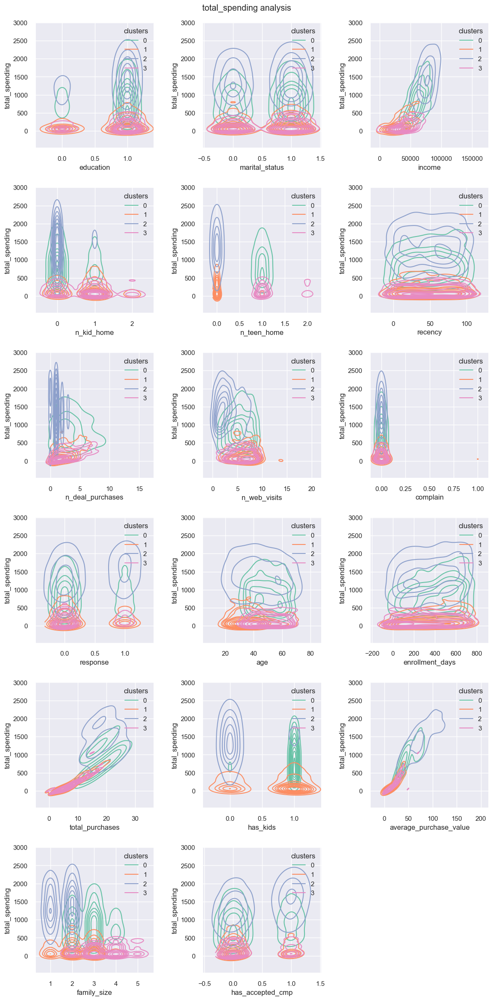

In [19]:
def kde_plots(data: pd.DataFrame, x_field: list[str], y_field: str, hue: str) -> None:
    if y_field in x_field:
        x_field.remove(y_field)
    fig_rows = 1 + (len(x_field) // 3)
    fig_cols = 3
    fig_sz = 4
    remain = fig_cols - (len(x_field) % fig_cols)
    fig, ax = plt.subplots(
        fig_rows, fig_cols, figsize=(fig_cols * fig_sz, fig_rows * fig_sz)
    )
    fig.suptitle(f"{y_field} analysis")

    for idx, x in enumerate(x_field):
        sns.kdeplot(
            data=data,
            x=x,
            y=y_field,
            hue=hue,
            palette="Set2",
            ax=ax[idx // fig_cols, idx % fig_cols],
        )

    for i in reversed(range(remain)):
        fig.delaxes(ax[fig_rows - 1][fig_cols - 1 - i])

    plt.tight_layout(pad=2)


kde_plots(
    data=clustered_data,
    x_field=list(keep_fields),
    y_field="total_spending",
    hue="clusters",
)